## Dependencies

In [1]:
import os, random, json, PIL, shutil, re, imageio, glob, warnings
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import ImageDraw, Image
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
import tensorflow.keras.layers as L
import tensorflow.keras.backend as K
import kagglehub
from tensorflow.keras import Model, losses, optimizers
from tensorflow.keras.callbacks import Callback
from google.colab import drive
import re
import os


random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)
os.environ['PYTHONHASHSEED'] = str(42)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

warnings.filterwarnings('ignore')

In [2]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
AUTO = tf.data.AUTOTUNE

# Model parameters

In [4]:
HEIGHT = 256
WIDTH = 256
HEIGHT_RESIZE = 128
WIDTH_RESIZE = 128
CHANNELS = 3
BATCH_SIZE = 16
EPOCHS = 130
TRANSFORMER_BLOCKS = 6
GENERATOR_LR = 2e-4
DISCRIMINATOR_LR = 2e-4

# Load data

In [5]:
def count_data_items(filenames):
    return np.sum(int(f.split("-")[-1].split(".")[0]) for f in filenames)

In [6]:
drive.mount('/content/drive')

DATASET_PATH = '/content/drive/MyDrive/Digital Signal/Data/'

MONET_FILENAMES = tf.io.gfile.glob(os.path.join(DATASET_PATH, 'monet_tfrec', '*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(os.path.join(DATASET_PATH, 'photo_tfrec', '*.tfrec'))

#random.shuffle(MONET_FILENAMES)
#random.shuffle(PHOTO_FILENAMES)

n_monet_samples = count_data_items(MONET_FILENAMES)
n_photo_samples = count_data_items(PHOTO_FILENAMES)

print(f'Monet files: {len(MONET_FILENAMES)}')
print(f'Photo files: {len(PHOTO_FILENAMES)}')

Mounted at /content/drive
Monet files: 5
Photo files: 20


In [7]:
print(f'Monet instances: {n_monet_samples}')
print(f'Photo instacnes: {n_photo_samples}')

Monet instances: 300
Photo instacnes: 7038


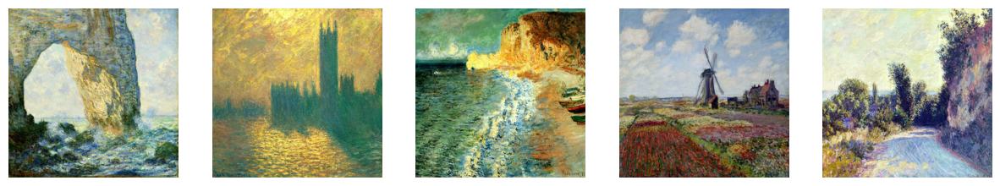

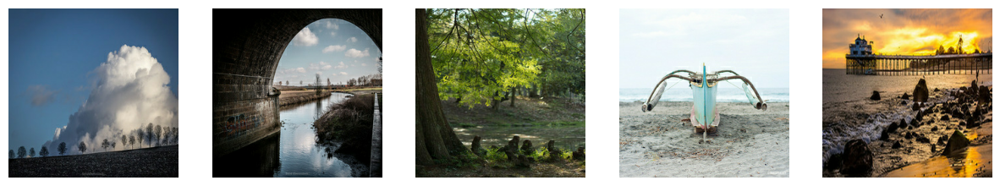

In [8]:
def parse_tfrecord(serialized_example):

    tfrecord_format = {
        'image':      tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(serialized_example, tfrecord_format)
    image = tf.image.decode_jpeg(example['image'], channels=CHANNELS)
    image = tf.image.resize(image, [HEIGHT, WIDTH])
    return image

def show_images_from_tfrecord(filenames, num_images=5):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(parse_tfrecord)
    plt.figure(figsize=(15, 9))
    for i, image in enumerate(dataset.take(num_images)):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(tf.cast(image, tf.uint8).numpy())
        plt.axis("off")
    plt.show()


show_images_from_tfrecord(MONET_FILENAMES)
show_images_from_tfrecord(PHOTO_FILENAMES)

## Pre processing and data loading

In [9]:
def data_augment(image):
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)

    if p_rotate > .8:
        image = tf.image.rot90(image, k=3)
    elif p_rotate > .6:
        image = tf.image.rot90(image, k=2)
    elif p_rotate > .4:
        image = tf.image.rot90(image, k=1)


    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    if p_spatial > .75:
        image = tf.image.transpose(image)

    image = tf.image.random_crop(image, size=[HEIGHT_RESIZE, WIDTH_RESIZE, CHANNELS])


    return image

In [10]:

def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    return (img / 127.5) - 1.0

def load_dataset(filenames):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(parse_tfrecord, num_parallel_calls=AUTO)
    return dataset

def get_dataset(filenames, augment=None, repeat=True, shuffle=True, batch_size=1):
    dataset = load_dataset(filenames)

    if augment:
        dataset = dataset.map(augment, num_parallel_calls=AUTO)
    dataset = dataset.map(normalize_img, num_parallel_calls=AUTO)
    if repeat:
        dataset = dataset.repeat()
    if shuffle:
        dataset = dataset.shuffle(512)

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(AUTO)

    return dataset



# Model componenets definition

In [11]:
conv_initializer = tf.random_normal_initializer(mean=0.0, stddev=0.02)
gamma_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

def encoder_block(input_layer, filters, size=3, strides=2, apply_instancenorm=True, activation=keras.layers.ReLU()):
    block = keras.layers.Conv2D(filters, size,
                     strides=strides,
                     padding='same',
                     use_bias=False,
                     kernel_initializer=conv_initializer)(input_layer)

    if apply_instancenorm:
        block = keras.layers.LayerNormalization(gamma_initializer=gamma_initializer)(block)

    block = activation(block)

    return block

def transformer_block(input_layer, size=3, strides=1):
    filters = input_layer.shape[-1]

    block = keras.layers.Conv2D(filters, size, strides=strides, padding='same', use_bias=False,
                     kernel_initializer=conv_initializer)(input_layer)

    block = keras.layers.ReLU()(block)

    block = keras.layers.Conv2D(filters, size, strides=strides, padding='same', use_bias=False,
                     kernel_initializer=conv_initializer)(block)

    block = keras.layers.Add()([block, input_layer])

    return block

def decoder_block(input_layer, filters, size=3, strides=2):
    block = keras.layers.Conv2DTranspose(filters, size,
                              strides=strides,
                              padding='same',
                              use_bias=False,
                              kernel_initializer=conv_initializer)(input_layer)


    block = keras.layers.LayerNormalization(gamma_initializer=gamma_initializer)(block)

    block = keras.layers.ReLU()(block)

    return block


In [12]:
def generator_fn(height=HEIGHT, width=WIDTH, channels=CHANNELS):
    OUTPUT_CHANNELS = 3
    inputs = keras.layers.Input(shape=[height, width, channels])

    # Encoder
    enc_1 = encoder_block(inputs, 64,  7, 1, apply_instancenorm=False)
    enc_2 = encoder_block(enc_1, 128, 3, 2, apply_instancenorm=True)
    enc_3 = encoder_block(enc_2, 256, 3, 2, apply_instancenorm=True)

    # Transformer
    x = enc_3
    for n in range(TRANSFORMER_BLOCKS):
        x = transformer_block(x, 3, 1)

    # Decoder
    x_skip = keras.layers.Concatenate()([x, enc_3])

    dec_1 = decoder_block(x_skip, 128, 3, 2)
    x_skip = keras.layers.Concatenate()([dec_1, enc_2])

    dec_2 = decoder_block(x_skip, 64,  3, 2)
    x_skip = keras.layers.Concatenate()([dec_2, enc_1])

    outputs = last = L.Conv2D(OUTPUT_CHANNELS, 7,
                              strides=1, padding='same',
                              kernel_initializer=conv_initializer,
                              use_bias=False,
                              activation='tanh')(x_skip)

    generator = Model(inputs, outputs)

    return generator

sample_generator = generator_fn()
sample_generator.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          9,408 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 64, 64, 256)    │              0 │ conv2d[0][0],          │
│                           │                        │                │ layer_normalization[0… │
│                           │                        │                │ layer_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 128, 128, 128)  │         73,728 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization       │ (None, 128, 128, 128)  │            256 │ conv2d_1[0][0]         │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 64, 256)    │        294,912 │ re_lu[1][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_1     │ (None, 64, 64, 256)    │            512 │ conv2d_2[0][0]         │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 256)    │        589,824 │ re_lu[2][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 64, 64, 256)    │              0 │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        589,824 │ re_lu_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 64, 64, 256)    │              0 │ conv2d_4[0][0],        │
│                           │                        │                │ re_lu[2][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 256)    │        589,824 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 64, 64, 256)    │              0 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 64, 64, 256)    │        589,824 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 64, 64, 256)    │              0 │ conv2d_6[0][0],        │
│                           │                        │                │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 64, 64, 256)    │        589,824 │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)       

 Total params: 8,213,184 (31.33 MB)

 Trainable params: 8,213,184 (31.33 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
def discriminator_fn(height=HEIGHT, width=WIDTH, channels=CHANNELS):
    inputs = keras.layers.Input(shape=[height, width, channels])


    # Encoder
    x = encoder_block(inputs, 64,  4, 2, apply_instancenorm=False, activation=keras.layers.LeakyReLU(0.2))
    x = encoder_block(x, 128, 4, 2, apply_instancenorm=True, activation=keras.layers.LeakyReLU(0.2))
    x = encoder_block(x, 256, 4, 2, apply_instancenorm=True, activation=keras.layers.LeakyReLU(0.2))
    x = encoder_block(x, 512, 4, 1, apply_instancenorm=True, activation=keras.layers.LeakyReLU(0.2))

    outputs = keras.layers.Conv2D(1, 4, strides=1, padding='valid', kernel_initializer=conv_initializer)(x)

    discriminator = Model(inputs, outputs)

    return discriminator


sample_discriminator = discriminator_fn()
sample_discriminator.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 128, 128, 64)        │           3,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 64, 64, 128)         │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer_normalization_4                │ (None, 64, 64, 128)         │             256 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_18 (Conv2D)                   │ (None, 32, 32, 256)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer_normalization_5                │ (None, 32, 32, 256)         │             512 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 32, 32, 512)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer_normalization_6                │ (None, 32, 32, 512)         │           1,024 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 29, 29, 1)           │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,765,569 (10.55 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 0 (0.00 B)

# Build model (CycleGAN)

In [14]:

with tf.device('/GPU:0'):
  monet_generator = generator_fn(height=None, width=None)
  photo_generator = generator_fn(height=None, width=None)

  monet_discriminator = discriminator_fn(height=None, width=None)
  photo_discriminator = discriminator_fn(height=None, width=None)


class CycleGan(Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle

    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        real_monet, real_photo = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))

        return {'monet_gen_loss': total_monet_gen_loss,
                'photo_gen_loss': total_photo_gen_loss,
                'monet_disc_loss': monet_disc_loss,
                'photo_disc_loss': photo_disc_loss,
                'cycle_loss': total_cycle_loss
               }

# Loss functions

In [15]:
with tf.device('/GPU:0'):

  def discriminator_loss(real, generated):


      real_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(real), real)

      generated_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.zeros_like(generated), generated)

      total_disc_loss = real_loss + generated_loss

      return total_disc_loss * 0.5

  def generator_loss(generated):
      return losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(generated), generated)



  def calc_cycle_loss(real_image, cycled_image, LAMBDA):
      loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

      return LAMBDA * loss1

  def identity_loss(real_image, same_image, LAMBDA):
      loss = tf.reduce_mean(tf.abs(real_image - same_image))
      return LAMBDA * 0.5 * loss

# Learning rate schedule


130 total epochs and 439 steps per epoch
Learning rate schedule: 0.0002 to 0.0002 to 3.5e-07


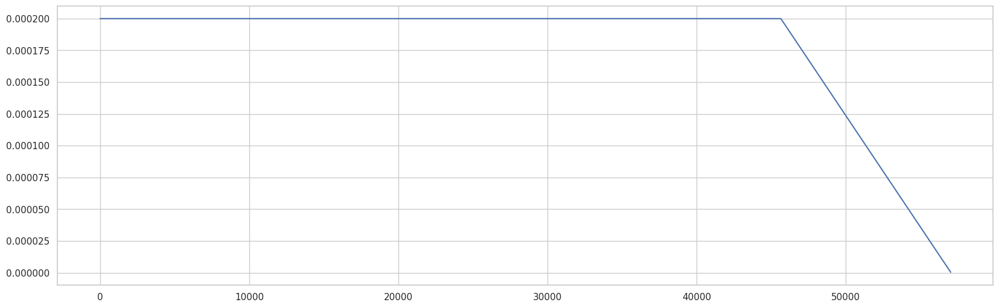

In [16]:
@tf.function
def linear_schedule_with_warmup(step):
    """ Create a schedule with a learning rate that decreases linearly after
    linearly increasing during a warmup period.
    """
    lr_start   = 2e-4
    lr_max     = 2e-4
    lr_min     = 0.

    steps_per_epoch = 400
    total_steps = EPOCHS * steps_per_epoch
    warmup_steps = 1
    hold_max_steps = total_steps * 0.8

    if step < warmup_steps:
        lr = (lr_max - lr_start) / warmup_steps * step + lr_start
    elif step < warmup_steps + hold_max_steps:
        lr = lr_max
    else:
        lr = lr_max * ((total_steps - step) / (total_steps - warmup_steps - hold_max_steps))
        if lr_min is not None:
            lr = tf.math.maximum(lr_min, lr)

    return lr

steps_per_epoch = int(max(n_monet_samples, n_photo_samples)//BATCH_SIZE)
total_steps = EPOCHS * steps_per_epoch
rng = [i for i in range(0, total_steps, 50)]
y = [linear_schedule_with_warmup(x) for x in rng]

sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(20, 6))
plt.plot(rng, y)
print(f'{EPOCHS} total epochs and {steps_per_epoch} steps per epoch')
print(f'Learning rate schedule: {y[0]:.3g} to {max(y):.3g} to {y[-1]:.3g}')

# Train

In [17]:
with tf.device('/GPU:0'):
  # Create generators
  lr_monet_gen = lambda: linear_schedule_with_warmup(tf.cast(monet_generator_optimizer.iterations, tf.float32))
  lr_photo_gen = lambda: linear_schedule_with_warmup(tf.cast(photo_generator_optimizer.iterations, tf.float32))

  monet_generator_optimizer = optimizers.Adam(learning_rate=lr_monet_gen, beta_1=0.5)
  photo_generator_optimizer = optimizers.Adam(learning_rate=lr_photo_gen, beta_1=0.5)

  # Create discriminators
  lr_monet_disc = lambda: linear_schedule_with_warmup(tf.cast(monet_discriminator_optimizer.iterations, tf.float32))
  lr_photo_disc = lambda: linear_schedule_with_warmup(tf.cast(photo_discriminator_optimizer.iterations, tf.float32))

  monet_discriminator_optimizer = optimizers.Adam(learning_rate=lr_monet_disc, beta_1=0.5)
  photo_discriminator_optimizer = optimizers.Adam(learning_rate=lr_photo_disc, beta_1=0.5)


  # Create GAN
  gan_model = CycleGan(monet_generator, photo_generator,
                      monet_discriminator, photo_discriminator)

  gan_model.compile(m_gen_optimizer=monet_generator_optimizer,
                    p_gen_optimizer=photo_generator_optimizer,
                    m_disc_optimizer=monet_discriminator_optimizer,
                    p_disc_optimizer=photo_discriminator_optimizer,
                    gen_loss_fn=generator_loss,
                    disc_loss_fn=discriminator_loss,
                    cycle_loss_fn=calc_cycle_loss,
                    identity_loss_fn=identity_loss)

In [18]:
# Create dataset
monet_ds = get_dataset(MONET_FILENAMES, augment=data_augment, batch_size=BATCH_SIZE)
photo_ds = get_dataset(PHOTO_FILENAMES, augment=data_augment, batch_size=BATCH_SIZE)
gan_ds = tf.data.Dataset.zip((monet_ds, photo_ds))

photo_ds_eval = get_dataset(PHOTO_FILENAMES, repeat=False, shuffle=False, batch_size=1)
monet_ds_eval = get_dataset(MONET_FILENAMES, repeat=False, shuffle=False, batch_size=1)

class GANMonitor(Callback):
    def __init__(self, monet_path='monet', photo_path='photo'):
        self.monet_path = monet_path
        self.photo_path = photo_path
        os.makedirs(self.monet_path, exist_ok=True)
        os.makedirs(self.photo_path, exist_ok=True)

    def on_epoch_end(self, epoch, logs=None):
        target_index = 5  # Index target image

        img = list(photo_ds_eval.take(target_index + 1))[-1]
        prediction = monet_generator(img, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        prediction = PIL.Image.fromarray(prediction)
        prediction.save(f'{self.monet_path}/generated_{target_index}_{epoch+1}.png')

        img = list(monet_ds_eval.take(target_index + 1))[-1]
        prediction = photo_generator(img, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        prediction = PIL.Image.fromarray(prediction)
        prediction.save(f'{self.photo_path}/generated_{target_index}_{epoch+1}.png')

In [19]:
history = gan_model.fit(gan_ds,
                        epochs=EPOCHS,
                        callbacks=[GANMonitor()],
                        steps_per_epoch=400,
                        verbose=1).history

Epoch 1/130
400/400 ━━━━━━━━━━━━━━━━━━━━ 141s 259ms/step - cycle_loss: 2.2437 - monet_disc_loss: 0.6072 - monet_gen_loss: 3.6336 - photo_disc_loss: 0.5791 - photo_gen_loss: 3.6957
Epoch 2/130
400/400 ━━━━━━━━━━━━━━━━━━━━ 103s 258ms/step - cycle_loss: 1.5113 - monet_disc_loss: 0.6224 - monet_gen_loss: 2.7116 - photo_disc_loss: 0.5762 - photo_gen_loss: 2.8590
Epoch 3/130
400/400 ━━━━━━━━━━━━━━━━━━━━ 103s 258ms/step - cycle_loss: 1.3173 - monet_disc_loss: 0.6198 - monet_gen_loss: 2.4887 - photo_disc_loss: 0.5703 - photo_gen_loss: 2.6525
Epoch 4/130
400/400 ━━━━━━━━━━━━━━━━━━━━ 103s 258ms/step - cycle_loss: 1.2297 - monet_disc_loss: 0.6031 - monet_gen_loss: 2.4527 - photo_disc_loss: 0.5683 - photo_gen_loss: 2.5738
Epoch 5/130
400/400 ━━━━━━━━━━━━━━━━━━━━ 103s 258ms/step - cycle_loss: 1.1979 - monet_disc_loss: 0.6099 - monet_gen_loss: 2.4086 - photo_disc_loss: 0.5627 - photo_gen_loss: 2.5462
Epoch 6/130
400/400 ━━━━━━━━━━━━━━━━━━━━ 103s 258ms/step - cycle_loss: 1.1797 - monet_disc_loss: 0.6

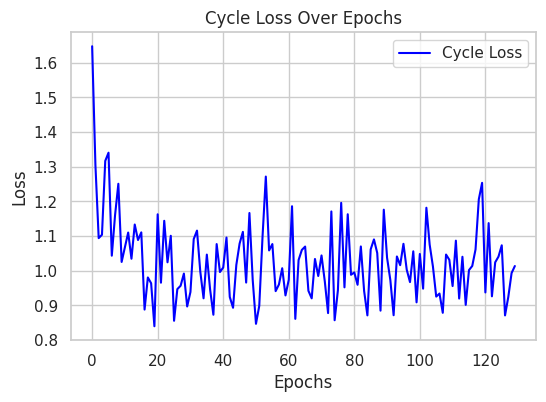

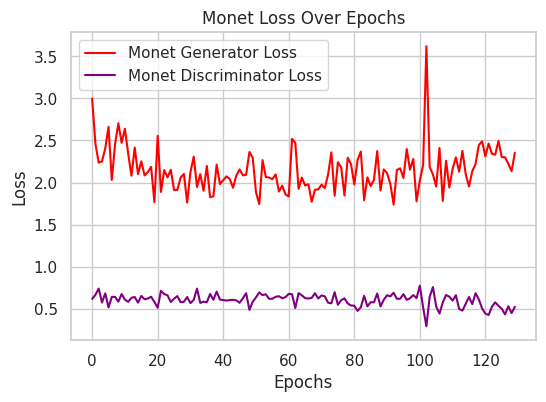

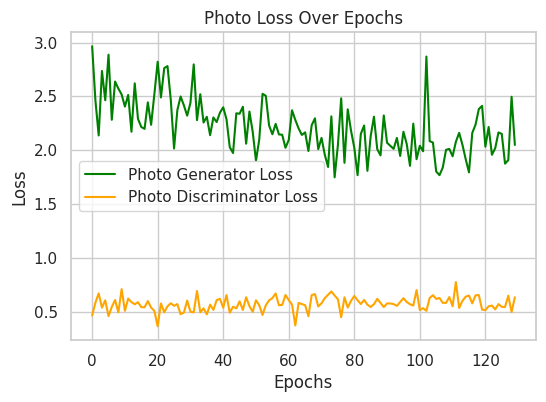

In [20]:
def plot_loss(history):

    def process_loss(loss_array):
        loss_array = np.array(loss_array)
        return np.mean(loss_array, axis=tuple(range(1, loss_array.ndim))) if loss_array.ndim > 1 else loss_array


    # Cycle Loss
    plt.figure(figsize=(6, 4))
    plt.plot(range(EPOCHS), history['cycle_loss'], label='Cycle Loss', color='blue')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Cycle Loss Over Epochs')
    plt.legend()
    plt.show()

    # Monet Loss (Generator + Discriminator)
    plt.figure(figsize=(6, 4))
    plt.plot(range(EPOCHS), process_loss(history['monet_gen_loss']), label='Monet Generator Loss', color='red')
    plt.plot(range(EPOCHS), process_loss(history['monet_disc_loss']), label='Monet Discriminator Loss', color='purple')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Monet Loss Over Epochs')
    plt.legend()
    plt.show()

    # Photo Loss (Generator + Discriminator)
    plt.figure(figsize=(6, 4))
    plt.plot(range(EPOCHS), process_loss(history['photo_gen_loss']), label='Photo Generator Loss', color='green')
    plt.plot(range(EPOCHS), process_loss(history['photo_disc_loss']), label='Photo Discriminator Loss', color='orange')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Photo Loss Over Epochs')
    plt.legend()
    plt.show()

plot_loss(history)

In [21]:
monet_generator.save_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/monet_generator.weights.h5')
photo_generator.save_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/photo_generator.weights.h5')
monet_discriminator.save_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/monet_discriminator.weights.h5')
photo_discriminator.save_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/photo_discriminator.weights.h5')

# Result Display

In [22]:
monet_generator.load_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/monet_generator.weights.h5')
photo_generator.load_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/photo_generator.weights.h5')
monet_discriminator.load_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/monet_discriminator.weights.h5')
photo_discriminator.load_weights('/content/drive/MyDrive/Digital Signal/Data/weightsGAN/photo_discriminator.weights.h5')

In [23]:
def display_generated_samples(ds, model, n_samples):
    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        example_sample = next(ds_iter)
        generated_sample = model.predict(example_sample)

        f = plt.figure(figsize=(12, 12))

        plt.subplot(121)
        plt.title('Input image')
        plt.imshow(example_sample[0] * 0.5 + 0.5)
        plt.axis('off')

        plt.subplot(122)
        plt.title('Generated image')
        plt.imshow(generated_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

def evaluate_cycle(ds, generator_a, generator_b, n_samples=1):
    fig, axes = plt.subplots(n_samples, 3, figsize=(22, (n_samples*6)))
    axes = axes.flatten()

    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        idx = n_sample*3
        example_sample = next(ds_iter)
        generated_a_sample = generator_a.predict(example_sample)
        generated_b_sample = generator_b.predict(generated_a_sample)

        axes[idx].set_title('Input image', fontsize=18)
        axes[idx].imshow(example_sample[0] * 0.5 + 0.5)
        axes[idx].axis('off')

        axes[idx+1].set_title('Generated image', fontsize=18)
        axes[idx+1].imshow(generated_a_sample[0] * 0.5 + 0.5)
        axes[idx+1].axis('off')

        axes[idx+2].set_title('Cycled image', fontsize=18)
        axes[idx+2].imshow(generated_b_sample[0] * 0.5 + 0.5)
        axes[idx+2].axis('off')

    plt.show()

def create_gif(images_path, gif_path):
    images = []
    filenames = glob.glob(images_path)
    filenames.sort(key=lambda x: int(''.join(filter(str.isdigit, x))))
    for epoch, filename in enumerate(filenames):
        img = PIL.ImageDraw.Image.open(filename)
        ImageDraw.Draw(img).text((0, 0),  # Coordinates
                                 f'Epoch {epoch+1}')
        images.append(img)
    imageio.mimsave(gif_path, images, fps=2) # Save gif


In [24]:
create_gif('monet/*.png', 'monet.gif') # Create monet gif

<img src='monet.gif' width=350>

## Photo generation GIF

In [25]:
create_gif('photo/*.png', 'photo.gif') # Create photo gif

<img src='photo.gif' width=350>

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


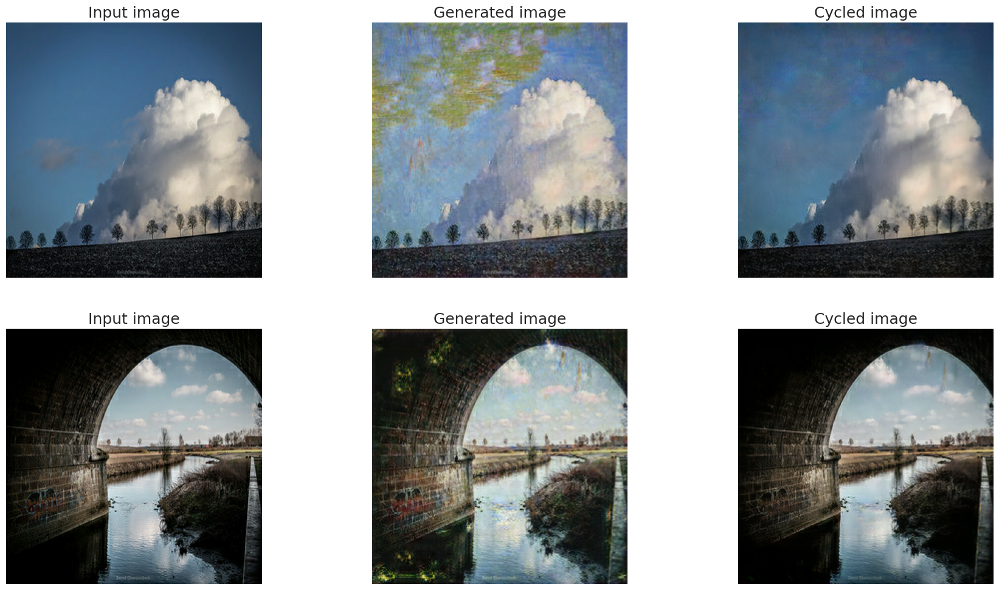

In [26]:
evaluate_cycle(photo_ds_eval.take(2), monet_generator, photo_generator, n_samples=2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


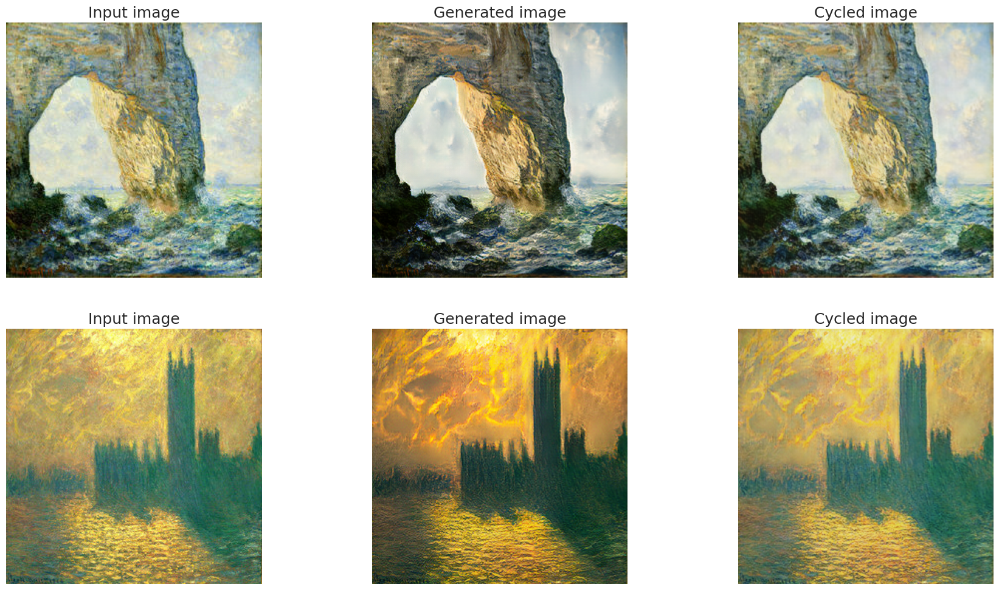

In [27]:
evaluate_cycle(monet_ds_eval.take(2), photo_generator, monet_generator, n_samples=2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


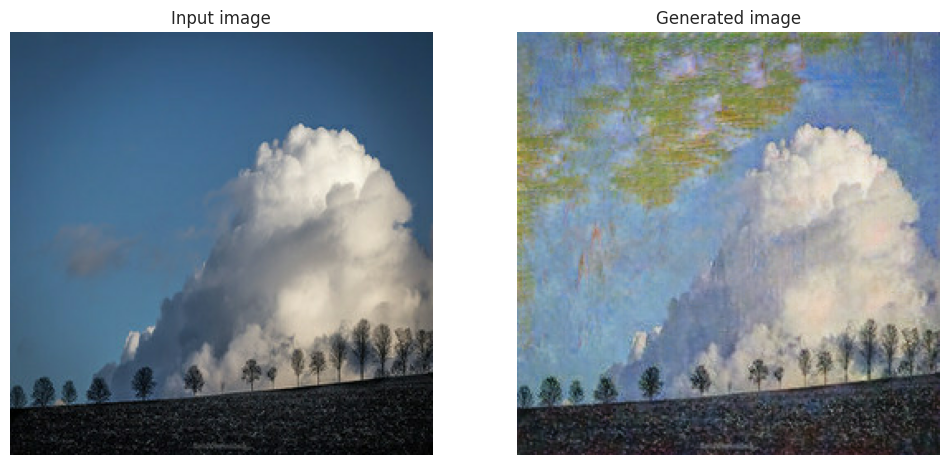

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


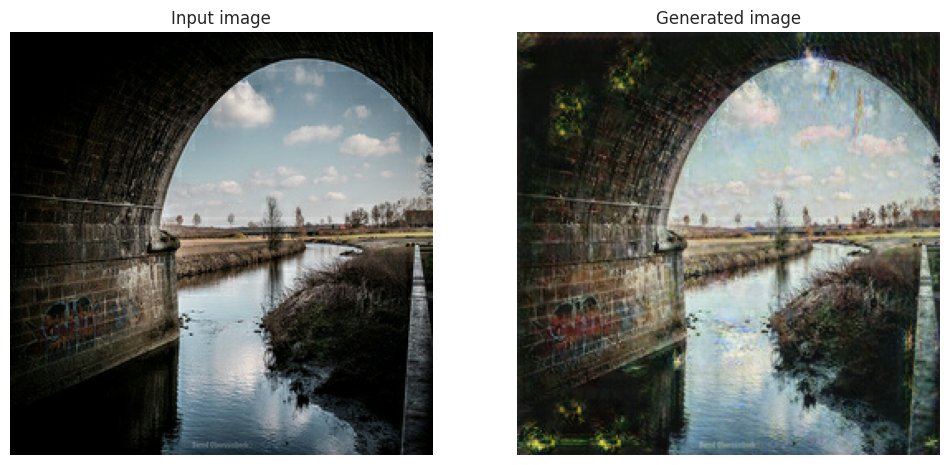

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


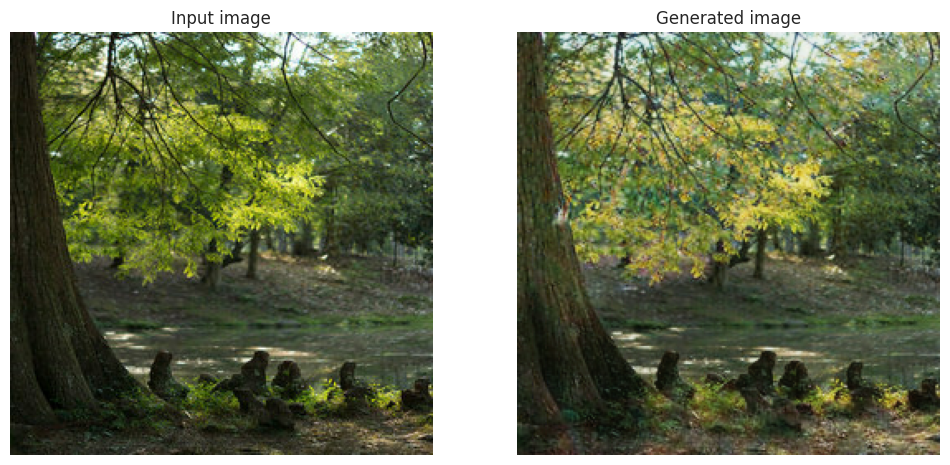

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


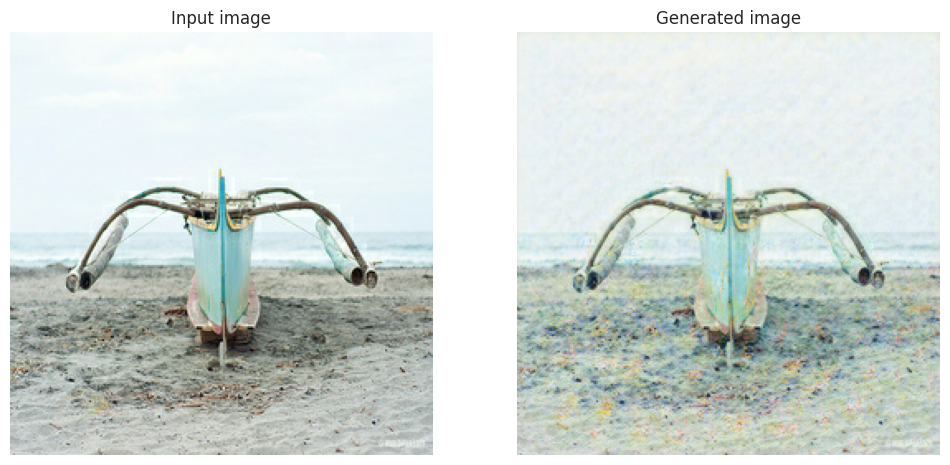

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


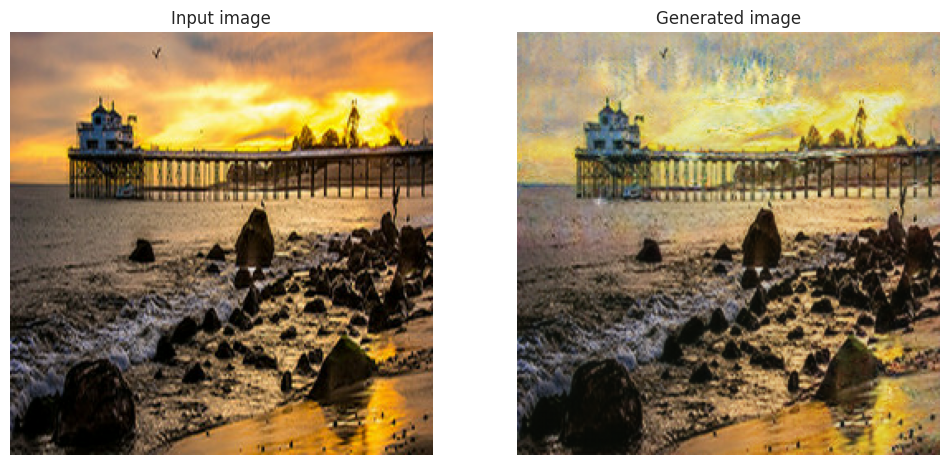

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


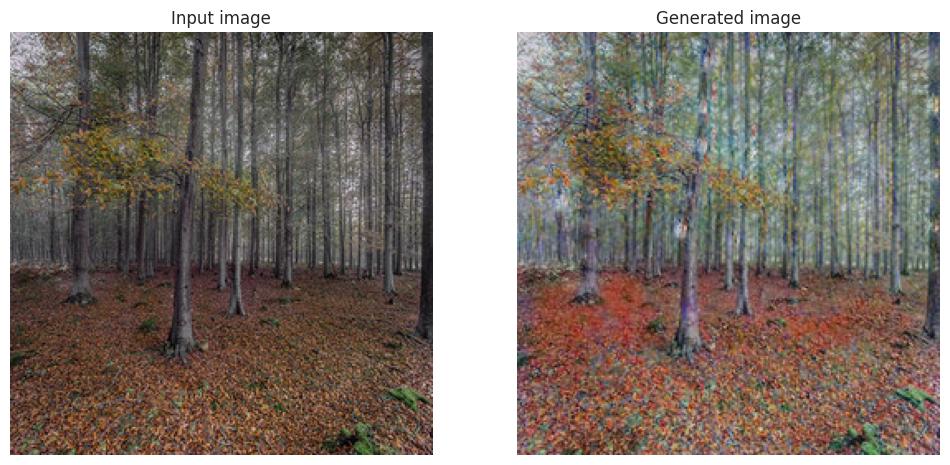

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


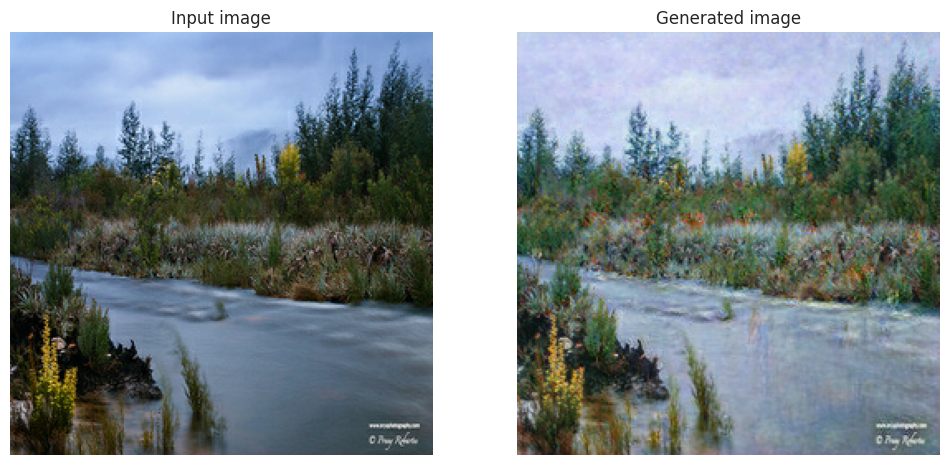

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


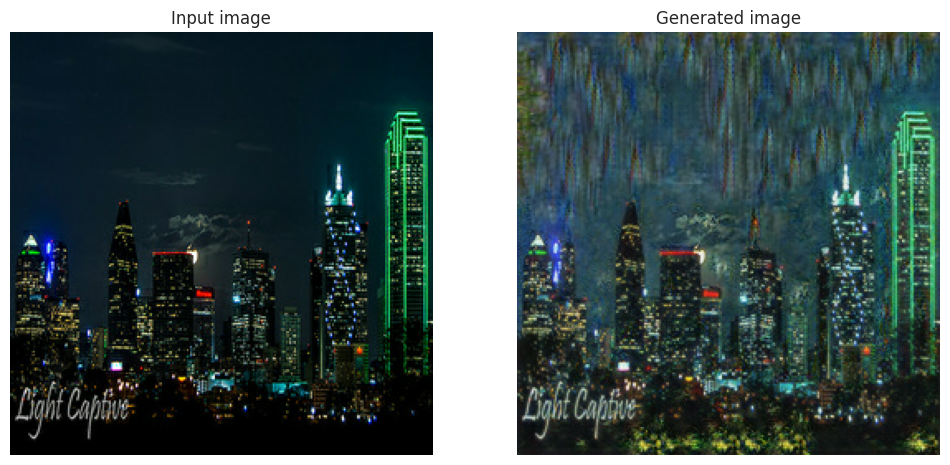

In [28]:
display_generated_samples(photo_ds_eval.take(8), monet_generator, 8)